# Calidad del aire
- Origen de datos: www.aire.cdmx.gob.mx/default.php?opc='aKBh'

# Dependencias

In [1]:
# Manejo de datos y archivos
from glob import glob 
import pandas as pd
import numpy as np
import os

# Manejo de fechas
from dateutil.relativedelta import relativedelta as rd
from datetime import datetime, date

# Multitrheads
from multiprocessing import Pool

# Redacción de dimensiones
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.manifold import TSNE,MDS 

# Estadística
from sklearn.impute import SimpleImputer
from scipy import stats

# Otros
from varclushi import VarClusHi
from functools import reduce
import cufflinks as cf

cf.go_offline()
pd.set_option('display.max_columns', None)

## Funciones auxiliares

In [2]:
def make_pool(func, params, threads):
    """
    Ejecuta de forma simultánea múltiples llamadas a una función

    # Parámetros: 
    - function: objeto función a paralelizar.
    - params: iterable, parámetros de evaluación paralela.
    - threads: int, número de hilos de multiprocesamiento.

    # Retorna: 
        list, resultado de la ejecución paralela agrupada en una lista
    """
    pool = Pool(threads)
    data = pool.starmap(func, params)
    pool.close()
    pool.join()
    del pool
    return [x for x in data]

def leerDatos(archivo: str, columnas: tuple = ('FECHA', 'HORA')) -> pd.DataFrame:
    """
    Lee datos desde un archivo CSV y realiza transformaciones específicas.

    # Parámetros:
    - archivo (str): La ruta al archivo CSV que se va a leer.
    - columnas (tuple): Una tupla que contiene los nombres de las columnas para la fecha y la hora en el archivo CSV.
                       Por defecto, se asume que las columnas se llaman 'FECHA' y 'HORA'.

    # Retorna:
    pd.DataFrame: Un DataFrame de pandas que contiene los datos leídos y transformados.
    """
    data = pd.read_csv(archivo)
    data['ts'] = pd.to_datetime(
        data[columnas[0]] + " " + (data[columnas[1]].map(int) - 1).map(lambda x: f'{x:02d}:00:00'))
    data = data.drop(data.columns[:2], axis=1)

    contaminante = archivo.split('\\')[-1].split('.')[0][4:]
    data['CONTAMINANTE'] = contaminante
    data = data.melt(var_name='ESTACION', value_name='VALOR', id_vars=['CONTAMINANTE', 'ts'])
    return data


# Lectura de datos

In [3]:
try:
    data = pd.read_parquet('aire.parquet')
    print("Archivo leído")
except FileNotFoundError:
    ruta = 'C:/Users/Germain/Downloads/Tarea/Datos/*.csv'
    archivos = glob(ruta)
    print(f"Cantidad de archivos: {len(archivos)}")
    data = pd.concat(map(leerDatos, archivos), ignore_index=True)
    data.to_parquet('aire.parquet')
print(data.shape)
data.head()

Archivo leído
(21768408, 4)


,CONTAMINANTE,ts,ESTACION,VALOR
0,CO,2010-01-01 00:00:00,LAG,1.6
1,CO,2010-01-01 01:00:00,LAG,1.1
2,CO,2010-01-01 02:00:00,LAG,1.1
3,CO,2010-01-01 03:00:00,LAG,0.3
4,CO,2010-01-01 04:00:00,LAG,0.4


# Ingeniería de características $\mathcal{X}$

In [4]:
vobs = 24 
vpred = 1
sub = 3
ini, fin = data['ts'].min(), data['ts'].max()
anclai, anclaf = ini + rd(hours=vobs-1), fin - rd(hours=vpred)
anclas = [anclai + rd(hours=i) for i in range((anclaf-anclai).days*24)]
print(f"Fechas. Inicio: {ini}. Fin: {fin}")
print(f"Anclas. Inicio: {anclai}. Fin: {anclaf}")
print(f"Cantidad de anclas: {len(anclas)}")

Fechas. Inicio: 2010-01-01 00:00:00. Fin: 2020-12-31 23:00:00
Anclas. Inicio: 2010-01-01 23:00:00. Fin: 2020-12-31 22:00:00
Cantidad de anclas: 96384


In [5]:
def ingX(data: pd.DataFrame, ancla: datetime, sub: int) -> pd.DataFrame:
    """
    Realiza realiza operaciones de agregación sobre la tabla, quedando como resultado columnas con la forma:
        'x_{contaminante}_{funcion}_ult_{horas}'
    # Parámetros:
    - data (pd.DataFrame): El DataFrame de datos de entrada que contiene la columna 'ts' de tipo datetime.
    - ancla (datetime): La fecha ancla alrededor de la cual se realizarán las operaciones de agregación.
    - sub (int): El tamaño de la ventana de tiempo en horas para la agregación.

    # Retorna:
        pd.DataFrame: Un DataFrame de pandas que contiene las agregaciones de datos dentro de la ventana de tiempo especificada.
    """
    ini = ancla - pd.Timedelta(hours=sub - 1)
    fin = ancla
    aux = data[(data['ts'] >= ini) & (data['ts'] <= fin)].copy()
    funciones = [np.min, np.max, np.mean, np.std, np.median]
    piv = aux.pivot_table(index='ESTACION', columns='CONTAMINANTE', values='VALOR', aggfunc=funciones)
    piv.columns = [f'x_{x}_{y}_ult_{sub}' for x, y in piv.columns]
    piv.reset_index(inplace=True)
    piv.insert(1, 'ancla', ancla)
    return piv

In [6]:
def ingy(data: pd.DataFrame, ancla: datetime, sub: int) -> pd.DataFrame:
    """
    Realiza realiza operaciones de agregación sobre la tabla, quedando como resultado columnas con la forma:
        'x_{contaminante}_sig_{horas}'
    # Parámetros:
    - data (pd.DataFrame): El DataFrame de datos de entrada que contiene la columna 'ts' de tipo datetime.
    - ancla (datetime): La fecha ancla alrededor de la cual se realizarán las operaciones de agregación.
    - sub (int): El tamaño de la ventana de tiempo en horas para la agregación.

    # Retorna:
        pd.DataFrame: Un DataFrame de pandas que contiene las agregaciones de datos dentro de la ventana de tiempo especificada.
    """
    ini = ancla
    fin = ancla + pd.Timedelta(hours=sub + 1)
    aux = data[(data['ts'] >= ini) & (data['ts'] <= fin)].copy()
    piv = aux.pivot_table(index="ESTACION", columns="CONTAMINANTE", values='VALOR', aggfunc=sum)
    piv.columns = [f"y_{x}_sig_{sub}" for x in piv.columns]
    piv.reset_index(inplace=True)
    piv.insert(1, 'ancla', ancla)
    return piv

In [37]:
um = ['ESTACION', 'ancla']
cruzar = lambda x, y: x.merge(y, on=um, how='outer')

def getX(ancla: datetime) -> pd.DataFrame:
    """
    Realiza un proceso de cruces y uniones (joins) de datos utilizando la función `ingX` y `reduce`.

    # Parámetros:
    - ancla (datetime): La fecha ancla alrededor de la cual se realizarán las operaciones de agregación.


    Utiliza la función `reduce` para combinar todos los DataFrames resultantes mediante la función `cruzar`    # Retorna:
    pd.DataFrame: Un DataFrame de pandas que resulta de unir y cruzar datos de acuerdo a las operaciones especificadas.
    """
    dataframes_resultantes = map(lambda sub: ingX(data, ancla, sub), range(sub, vobs + sub, sub))
    resultado_final = reduce(cruzar, dataframes_resultantes)
    return resultado_final

def gety(ancla: datetime) -> pd.DataFrame:
    """
    Realiza un proceso de cruces y uniones (joins) de datos utilizando la función `ingX` y `reduce`.

    # Parámetros:
    - ancla (datetime): La fecha ancla alrededor de la cual se realizarán las operaciones de agregación.


    Utiliza la función `reduce` para combinar todos los DataFrames resultantes mediante la función `cruzar`    # Retorna:
    pd.DataFrame: Un DataFrame de pandas que resulta de unir y cruzar datos de acuerdo a las operaciones especificadas.
    """
    dataframes_resultantes = map(lambda sub: ingy(data, ancla, sub), range(sub, vobs + sub, sub))
    resultado_final = reduce(cruzar, dataframes_resultantes)
    return resultado_final


### Prueba unitaria

In [8]:
"""
params = [(a,) for a in [anclas[0]]]
X = pd.concat(
    make_pool(get_var, params, threads=4),
    ignore_index=True)
print(X.shape)
"""
# > 4.7s; (34, 322)

'\nparams = [(a,) for a in [anclas[0]]]\nX = pd.concat(\n    make_pool(get_var, params, threads=4),\n    ignore_index=True)\nprint(X.shape)\n'

### Cálculo de $\mathcal{X}$

In [9]:
params = [(a,) for a in anclas[-1000:]]

In [54]:
try:
    X = pd.read_parquet('Xaire.parquet')
except FileExistsError:
    X = pd.concat(
        make_pool(getX, params, threads=4),
        ignore_index=True)
    X.to_parquet('Xaire.parquet')
print(X.shape)
X.head()

(36000, 362)


,ESTACION,ancla,x_amin_CO_ult_3,x_amin_NO_ult_3,x_amin_NO2_ult_3,x_amin_NOX_ult_3,x_amin_O3_ult_3,x_amin_PM10_ult_3,x_amin_PM25_ult_3,x_amin_PMCO_ult_3,x_amin_SO2_ult_3,x_amax_CO_ult_3,x_amax_NO_ult_3,x_amax_NO2_ult_3,x_amax_NOX_ult_3,x_amax_O3_ult_3,x_amax_PM10_ult_3,x_amax_PM25_ult_3,x_amax_PMCO_ult_3,x_amax_SO2_ult_3,x_mean_CO_ult_3,x_mean_NO_ult_3,x_mean_NO2_ult_3,x_mean_NOX_ult_3,x_mean_O3_ult_3,x_mean_PM10_ult_3,x_mean_PM25_ult_3,x_mean_PMCO_ult_3,x_mean_SO2_ult_3,x_std_CO_ult_3,x_std_NO_ult_3,x_std_NO2_ult_3,x_std_NOX_ult_3,x_std_O3_ult_3,x_std_PM10_ult_3,x_std_PM25_ult_3,x_std_PMCO_ult_3,x_std_SO2_ult_3,x_median_CO_ult_3,x_median_NO_ult_3,x_median_NO2_ult_3,x_median_NOX_ult_3,x_median_O3_ult_3,x_median_PM10_ult_3,x_median_PM25_ult_3,x_median_PMCO_ult_3,x_median_SO2_ult_3,x_amin_CO_ult_6,x_amin_NO_ult_6,x_amin_NO2_ult_6,x_amin_NOX_ult_6,x_amin_O3_ult_6,x_amin_PM10_ult_6,x_amin_PM25_ult_6,x_amin_PMCO_ult_6,x_amin_SO2_ult_6,x_amax_CO_ult_6,x_amax_NO_ult_6,x_amax_NO2_ult_6,x_amax_NOX_ult_6,x_amax_O3_ult_6,x_amax_PM10_ult_6,x_amax_PM25_ult_6,x_amax_PMCO_ult_6,x_amax_SO2_ult_6,x_mean_CO_ult_6,x_mean_NO_ult_6,x_mean_NO2_ult_6,x_mean_NOX_ult_6,x_mean_O3_ult_6,x_mean_PM10_ult_6,x_mean_PM25_ult_6,x_mean_PMCO_ult_6,x_mean_SO2_ult_6,x_std_CO_ult_6,x_std_NO_ult_6,x_std_NO2_ult_6,x_std_NOX_ult_6,x_std_O3_ult_6,x_std_PM10_ult_6,x_std_PM25_ult_6,x_std_PMCO_ult_6,x_std_SO2_ult_6,x_median_CO_ult_6,x_median_NO_ult_6,x_median_NO2_ult_6,x_median_NOX_ult_6,x_median_O3_ult_6,x_median_PM10_ult_6,x_median_PM25_ult_6,x_median_PMCO_ult_6,x_median_SO2_ult_6,x_amin_CO_ult_9,x_amin_NO_ult_9,x_amin_NO2_ult_9,x_amin_NOX_ult_9,x_amin_O3_ult_9,x_amin_PM10_ult_9,x_amin_PM25_ult_9,x_amin_PMCO_ult_9,x_amin_SO2_ult_9,x_amax_CO_ult_9,x_amax_NO_ult_9,x_amax_NO2_ult_9,x_amax_NOX_ult_9,x_amax_O3_ult_9,x_amax_PM10_ult_9,x_amax_PM25_ult_9,x_amax_PMCO_ult_9,x_amax_SO2_ult_9,x_mean_CO_ult_9,x_mean_NO_ult_9,x_mean_NO2_ult_9,x_mean_NOX_ult_9,x_mean_O3_ult_9,x_mean_PM10_ult_9,x_mean_PM25_ult_9,x_mean_PMCO_ult_9,x_mean_SO2_ult_9,x_std_CO_ult_9,x_std_NO_ult_9,x_std_NO2_ult_9,x_std_NOX_ult_9,x_std_O3_ult_9,x_std_PM10_ult_9,x_std_PM25_ult_9,x_std_PMCO_ult_9,x_std_SO2_ult_9,x_median_CO_ult_9,x_median_NO_ult_9,x_median_NO2_ult_9,x_median_NOX_ult_9,x_median_O3_ult_9,x_median_PM10_ult_9,x_median_PM25_ult_9,x_median_PMCO_ult_9,x_median_SO2_ult_9,x_amin_CO_ult_12,x_amin_NO_ult_12,x_amin_NO2_ult_12,x_amin_NOX_ult_12,x_amin_O3_ult_12,x_amin_PM10_ult_12,x_amin_PM25_ult_12,x_amin_PMCO_ult_12,x_amin_SO2_ult_12,x_amax_CO_ult_12,x_amax_NO_ult_12,x_amax_NO2_ult_12,x_amax_NOX_ult_12,x_amax_O3_ult_12,x_amax_PM10_ult_12,x_amax_PM25_ult_12,x_amax_PMCO_ult_12,x_amax_SO2_ult_12,x_mean_CO_ult_12,x_mean_NO_ult_12,x_mean_NO2_ult_12,x_mean_NOX_ult_12,x_mean_O3_ult_12,x_mean_PM10_ult_12,x_mean_PM25_ult_12,x_mean_PMCO_ult_12,x_mean_SO2_ult_12,x_std_CO_ult_12,x_std_NO_ult_12,x_std_NO2_ult_12,x_std_NOX_ult_12,x_std_O3_ult_12,x_std_PM10_ult_12,x_std_PM25_ult_12,x_std_PMCO_ult_12,x_std_SO2_ult_12,x_median_CO_ult_12,x_median_NO_ult_12,x_median_NO2_ult_12,x_median_NOX_ult_12,x_median_O3_ult_12,x_median_PM10_ult_12,x_median_PM25_ult_12,x_median_PMCO_ult_12,x_median_SO2_ult_12,x_amin_CO_ult_15,x_amin_NO_ult_15,x_amin_NO2_ult_15,x_amin_NOX_ult_15,x_amin_O3_ult_15,x_amin_PM10_ult_15,x_amin_PM25_ult_15,x_amin_PMCO_ult_15,x_amin_SO2_ult_15,x_amax_CO_ult_15,x_amax_NO_ult_15,x_amax_NO2_ult_15,x_amax_NOX_ult_15,x_amax_O3_ult_15,x_amax_PM10_ult_15,x_amax_PM25_ult_15,x_amax_PMCO_ult_15,x_amax_SO2_ult_15,x_mean_CO_ult_15,x_mean_NO_ult_15,x_mean_NO2_ult_15,x_mean_NOX_ult_15,x_mean_O3_ult_15,x_mean_PM10_ult_15,x_mean_PM25_ult_15,x_mean_PMCO_ult_15,x_mean_SO2_ult_15,x_std_CO_ult_15,x_std_NO_ult_15,x_std_NO2_ult_15,x_std_NOX_ult_15,x_std_O3_ult_15,x_std_PM10_ult_15,x_std_PM25_ult_15,x_std_PMCO_ult_15,x_std_SO2_ult_15,x_median_CO_ult_15,x_median_NO_ult_15,x_median_NO2_ult_15,x_median_NOX_ult_15,x_median_O3_ult_15,x_median_PM10_ult_15,x_median_PM25_ult_15,x_median_PMCO_ult_15,x_median_SO2_ult_15,x_amin_CO_ult_18,x_amin_

### Cálculo de $\mathcal{y}$

In [55]:
try:
    y = pd.read_parquet('yaire.parquet')
except FileExistsError:
    y = pd.concat(
        make_pool(gety, params, threads=4),
        ignore_index=True)
    y.to_parquet('yaire.parquet')
print(y.shape)
y.head()

(36000, 74)


,ESTACION,ancla,y_CO_sig_3,y_NO_sig_3,y_NO2_sig_3,y_NOX_sig_3,y_O3_sig_3,y_PM10_sig_3,y_PM25_sig_3,y_PMCO_sig_3,y_SO2_sig_3,y_CO_sig_6,y_NO_sig_6,y_NO2_sig_6,y_NOX_sig_6,y_O3_sig_6,y_PM10_sig_6,y_PM25_sig_6,y_PMCO_sig_6,y_SO2_sig_6,y_CO_sig_9,y_NO_sig_9,y_NO2_sig_9,y_NOX_sig_9,y_O3_sig_9,y_PM10_sig_9,y_PM25_sig_9,y_PMCO_sig_9,y_SO2_sig_9,y_CO_sig_12,y_NO_sig_12,y_NO2_sig_12,y_NOX_sig_12,y_O3_sig_12,y_PM10_sig_12,y_PM25_sig_12,y_PMCO_sig_12,y_SO2_sig_12,y_CO_sig_15,y_NO_sig_15,y_NO2_sig_15,y_NOX_sig_15,y_O3_sig_15,y_PM10_sig_15,y_PM25_sig_15,y_PMCO_sig_15,y_SO2_sig_15,y_CO_sig_18,y_NO_sig_18,y_NO2_sig_18,y_NOX_sig_18,y_O3_sig_18,y_PM10_sig_18,y_PM25_sig_18,y_PMCO_sig_18,y_SO2_sig_18,y_CO_sig_21,y_NO_sig_21,y_NO2_sig_21,y_NOX_sig_21,y_O3_sig_21,y_PM10_sig_21,y_PM25_sig_21,y_PMCO_sig_21,y_SO2_sig_21,y_CO_sig_24,y_NO_sig_24,y_NO2_sig_24,y_NOX_sig_24,y_O3_sig_24,y_PM10_sig_24,y_PM25_sig_24,y_PMCO_sig_24,y_SO2_sig_24
0,ACO,2020-11-19 07:00:00,-495.0,-495.0,-495.0,-495.0,-495.0,130.0,NaN,NaN,-495.0,-792.0,-792.0,-792.0,-792.0,-792.0,313.0,NaN,NaN,-792.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,450.0,NaN,NaN,-1089.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,582.0,NaN,NaN,-1386.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,746.0,NaN,NaN,-1683.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,831.0,NaN,NaN,-1980.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,940.0,NaN,NaN,-2277.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0,1111.0,NaN,NaN,-2574.0
1,AJM,2020-11-19 07:00:00,-495.0,-495.0,-495.0,-495.0,-495.0,-495.0,-495.0,-495.0,-495.0,-792.0,-792.0,-792.0,-792.0,-792.0,-792.0,-792.0,-792.0,-792.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,-1089.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,-1386.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,-1683.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,-1980.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,-2277.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0,-2574.0
2,AJU,2020-11-19 07:00:00,NaN,NaN,NaN,NaN,102.0,NaN,-384.0,NaN,NaN,NaN,NaN,NaN,NaN,264.0,NaN,-326.0,NaN,NaN,NaN,NaN,NaN,NaN,463.0,NaN,-259.0,NaN,NaN,NaN,NaN,NaN,NaN,501.0,NaN,-129.0,NaN,NaN,NaN,NaN,NaN,NaN,512.0,NaN,-81.0,NaN,NaN,NaN,NaN,NaN,NaN,521.0,NaN,-33.0,NaN,NaN,NaN,NaN,NaN,NaN,524.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,534.0,NaN,50.0,NaN,NaN
3,ATI,2020-11-19 07:00:00,1.1,64.0,78.0,143.0,96.0,65.0,NaN,NaN,3.0,1.5,72.0,118.0,190.0,223.0,103.0,NaN,NaN,6.0,1.8,76.0,157.0,234.0,343.0,200.0,NaN,NaN,20.0,2.8,86.0,238.0,324.0,371.0,307.0,NaN,NaN,83.0,3.5,99.0,300.0,402.0,386.0,371.0,NaN,NaN,148.0,3.8,100.0,325.0,428.0,421.0,413.0,NaN,NaN,161.0,4.2,108.0,354.0,465.0,438.0,457.0,NaN,NaN,168.0,5.5,192.0,406.0,601.0,443.0,537.0,NaN,NaN,178.0
4,BJU,2020-11-19 07:00:00,0.9,-495.0,88.0,-495.0,98.0,75.0,35.0,39.0,7.0,1.8,-792.0,171.0,-792.0,219.0,189.0,97.0,91.0,13.0,2.6,-1089.0,246.0,-1089.0,374.0,325.0,164.0,160.0,19.0,3.5,-1386.0,341.0,-1386.0,410.0,441.0,203.0,236.0,58.0,4.0,-1683.0,413.0,-1683.0,428.0,512.0,237.0,273.0,95.0,4.3,-1980.0,471.0,-1980.0,449.0,576.0,282.0,292.0,138.0,4.8,-2277.0,547.0,-2277.0,451.0,658.0,341.0,316.0,173.0,6.1,-2574.0,621.0,-2574.0,454.0,773.0,419.0,354.0,214.0


### Tupla $(\mathcal{X}, \mathcal{y})$

In [56]:
y = y[["ESTACION", "ancla", "y_O3_sig_3"]]
train = pd.merge(X, y,  how='left', left_on=['ESTACION','ancla'], right_on = ['ESTACION','ancla'])
print(train.shape)
train.head()

(36000, 363)


,ESTACION,ancla,x_amin_CO_ult_3,x_amin_NO_ult_3,x_amin_NO2_ult_3,x_amin_NOX_ult_3,x_amin_O3_ult_3,x_amin_PM10_ult_3,x_amin_PM25_ult_3,x_amin_PMCO_ult_3,x_amin_SO2_ult_3,x_amax_CO_ult_3,x_amax_NO_ult_3,x_amax_NO2_ult_3,x_amax_NOX_ult_3,x_amax_O3_ult_3,x_amax_PM10_ult_3,x_amax_PM25_ult_3,x_amax_PMCO_ult_3,x_amax_SO2_ult_3,x_mean_CO_ult_3,x_mean_NO_ult_3,x_mean_NO2_ult_3,x_mean_NOX_ult_3,x_mean_O3_ult_3,x_mean_PM10_ult_3,x_mean_PM25_ult_3,x_mean_PMCO_ult_3,x_mean_SO2_ult_3,x_std_CO_ult_3,x_std_NO_ult_3,x_std_NO2_ult_3,x_std_NOX_ult_3,x_std_O3_ult_3,x_std_PM10_ult_3,x_std_PM25_ult_3,x_std_PMCO_ult_3,x_std_SO2_ult_3,x_median_CO_ult_3,x_median_NO_ult_3,x_median_NO2_ult_3,x_median_NOX_ult_3,x_median_O3_ult_3,x_median_PM10_ult_3,x_median_PM25_ult_3,x_median_PMCO_ult_3,x_median_SO2_ult_3,x_amin_CO_ult_6,x_amin_NO_ult_6,x_amin_NO2_ult_6,x_amin_NOX_ult_6,x_amin_O3_ult_6,x_amin_PM10_ult_6,x_amin_PM25_ult_6,x_amin_PMCO_ult_6,x_amin_SO2_ult_6,x_amax_CO_ult_6,x_amax_NO_ult_6,x_amax_NO2_ult_6,x_amax_NOX_ult_6,x_amax_O3_ult_6,x_amax_PM10_ult_6,x_amax_PM25_ult_6,x_amax_PMCO_ult_6,x_amax_SO2_ult_6,x_mean_CO_ult_6,x_mean_NO_ult_6,x_mean_NO2_ult_6,x_mean_NOX_ult_6,x_mean_O3_ult_6,x_mean_PM10_ult_6,x_mean_PM25_ult_6,x_mean_PMCO_ult_6,x_mean_SO2_ult_6,x_std_CO_ult_6,x_std_NO_ult_6,x_std_NO2_ult_6,x_std_NOX_ult_6,x_std_O3_ult_6,x_std_PM10_ult_6,x_std_PM25_ult_6,x_std_PMCO_ult_6,x_std_SO2_ult_6,x_median_CO_ult_6,x_median_NO_ult_6,x_median_NO2_ult_6,x_median_NOX_ult_6,x_median_O3_ult_6,x_median_PM10_ult_6,x_median_PM25_ult_6,x_median_PMCO_ult_6,x_median_SO2_ult_6,x_amin_CO_ult_9,x_amin_NO_ult_9,x_amin_NO2_ult_9,x_amin_NOX_ult_9,x_amin_O3_ult_9,x_amin_PM10_ult_9,x_amin_PM25_ult_9,x_amin_PMCO_ult_9,x_amin_SO2_ult_9,x_amax_CO_ult_9,x_amax_NO_ult_9,x_amax_NO2_ult_9,x_amax_NOX_ult_9,x_amax_O3_ult_9,x_amax_PM10_ult_9,x_amax_PM25_ult_9,x_amax_PMCO_ult_9,x_amax_SO2_ult_9,x_mean_CO_ult_9,x_mean_NO_ult_9,x_mean_NO2_ult_9,x_mean_NOX_ult_9,x_mean_O3_ult_9,x_mean_PM10_ult_9,x_mean_PM25_ult_9,x_mean_PMCO_ult_9,x_mean_SO2_ult_9,x_std_CO_ult_9,x_std_NO_ult_9,x_std_NO2_ult_9,x_std_NOX_ult_9,x_std_O3_ult_9,x_std_PM10_ult_9,x_std_PM25_ult_9,x_std_PMCO_ult_9,x_std_SO2_ult_9,x_median_CO_ult_9,x_median_NO_ult_9,x_median_NO2_ult_9,x_median_NOX_ult_9,x_median_O3_ult_9,x_median_PM10_ult_9,x_median_PM25_ult_9,x_median_PMCO_ult_9,x_median_SO2_ult_9,x_amin_CO_ult_12,x_amin_NO_ult_12,x_amin_NO2_ult_12,x_amin_NOX_ult_12,x_amin_O3_ult_12,x_amin_PM10_ult_12,x_amin_PM25_ult_12,x_amin_PMCO_ult_12,x_amin_SO2_ult_12,x_amax_CO_ult_12,x_amax_NO_ult_12,x_amax_NO2_ult_12,x_amax_NOX_ult_12,x_amax_O3_ult_12,x_amax_PM10_ult_12,x_amax_PM25_ult_12,x_amax_PMCO_ult_12,x_amax_SO2_ult_12,x_mean_CO_ult_12,x_mean_NO_ult_12,x_mean_NO2_ult_12,x_mean_NOX_ult_12,x_mean_O3_ult_12,x_mean_PM10_ult_12,x_mean_PM25_ult_12,x_mean_PMCO_ult_12,x_mean_SO2_ult_12,x_std_CO_ult_12,x_std_NO_ult_12,x_std_NO2_ult_12,x_std_NOX_ult_12,x_std_O3_ult_12,x_std_PM10_ult_12,x_std_PM25_ult_12,x_std_PMCO_ult_12,x_std_SO2_ult_12,x_median_CO_ult_12,x_median_NO_ult_12,x_median_NO2_ult_12,x_median_NOX_ult_12,x_median_O3_ult_12,x_median_PM10_ult_12,x_median_PM25_ult_12,x_median_PMCO_ult_12,x_median_SO2_ult_12,x_amin_CO_ult_15,x_amin_NO_ult_15,x_amin_NO2_ult_15,x_amin_NOX_ult_15,x_amin_O3_ult_15,x_amin_PM10_ult_15,x_amin_PM25_ult_15,x_amin_PMCO_ult_15,x_amin_SO2_ult_15,x_amax_CO_ult_15,x_amax_NO_ult_15,x_amax_NO2_ult_15,x_amax_NOX_ult_15,x_amax_O3_ult_15,x_amax_PM10_ult_15,x_amax_PM25_ult_15,x_amax_PMCO_ult_15,x_amax_SO2_ult_15,x_mean_CO_ult_15,x_mean_NO_ult_15,x_mean_NO2_ult_15,x_mean_NOX_ult_15,x_mean_O3_ult_15,x_mean_PM10_ult_15,x_mean_PM25_ult_15,x_mean_PMCO_ult_15,x_mean_SO2_ult_15,x_std_CO_ult_15,x_std_NO_ult_15,x_std_NO2_ult_15,x_std_NOX_ult_15,x_std_O3_ult_15,x_std_PM10_ult_15,x_std_PM25_ult_15,x_std_PMCO_ult_15,x_std_SO2_ult_15,x_median_CO_ult_15,x_median_NO_ult_15,x_median_NO2_ult_15,x_median_NOX_ult_15,x_median_O3_ult_15,x_median_PM10_ult_15,x_median_PM25_ult_15,x_median_PMCO_ult_15,x_median_SO2_ult_15,x_amin_CO_ult_18,x_amin_

# Análisis Exploratorio de Datos

## Categorización de variables

In [12]:
varc = list(X.filter(like='x_').columns)
varc[:5], len(varc)

(['x_amin_CO_ult_3',
  'x_amin_NO_ult_3',
  'x_amin_NO2_ult_3',
  'x_amin_NOX_ult_3',
  'x_amin_O3_ult_3'],
 360)

## Ausentes

In [13]:
miss = (X[varc].isnull().sum()/len(X)).to_frame()
miss.columns = ['pct_miss']
fuera = list(miss[miss['pct_miss']>0.3].index)
varc = [v for v in varc if v not in fuera]
X.drop(fuera,axis=1,inplace=True)
print(f"Elementos eliminados: {len(fuera)}")
X.head()

Elementos eliminados: 80


,ESTACION,ancla,x_amin_CO_ult_3,x_amin_NO_ult_3,x_amin_NO2_ult_3,x_amin_NOX_ult_3,x_amin_O3_ult_3,x_amin_PM10_ult_3,x_amin_SO2_ult_3,x_amax_CO_ult_3,x_amax_NO_ult_3,x_amax_NO2_ult_3,x_amax_NOX_ult_3,x_amax_O3_ult_3,x_amax_PM10_ult_3,x_amax_SO2_ult_3,x_mean_CO_ult_3,x_mean_NO_ult_3,x_mean_NO2_ult_3,x_mean_NOX_ult_3,x_mean_O3_ult_3,x_mean_PM10_ult_3,x_mean_SO2_ult_3,x_std_CO_ult_3,x_std_NO_ult_3,x_std_NO2_ult_3,x_std_NOX_ult_3,x_std_O3_ult_3,x_std_PM10_ult_3,x_std_SO2_ult_3,x_median_CO_ult_3,x_median_NO_ult_3,x_median_NO2_ult_3,x_median_NOX_ult_3,x_median_O3_ult_3,x_median_PM10_ult_3,x_median_SO2_ult_3,x_amin_CO_ult_6,x_amin_NO_ult_6,x_amin_NO2_ult_6,x_amin_NOX_ult_6,x_amin_O3_ult_6,x_amin_PM10_ult_6,x_amin_SO2_ult_6,x_amax_CO_ult_6,x_amax_NO_ult_6,x_amax_NO2_ult_6,x_amax_NOX_ult_6,x_amax_O3_ult_6,x_amax_PM10_ult_6,x_amax_SO2_ult_6,x_mean_CO_ult_6,x_mean_NO_ult_6,x_mean_NO2_ult_6,x_mean_NOX_ult_6,x_mean_O3_ult_6,x_mean_PM10_ult_6,x_mean_SO2_ult_6,x_std_CO_ult_6,x_std_NO_ult_6,x_std_NO2_ult_6,x_std_NOX_ult_6,x_std_O3_ult_6,x_std_PM10_ult_6,x_std_SO2_ult_6,x_median_CO_ult_6,x_median_NO_ult_6,x_median_NO2_ult_6,x_median_NOX_ult_6,x_median_O3_ult_6,x_median_PM10_ult_6,x_median_SO2_ult_6,x_amin_CO_ult_9,x_amin_NO_ult_9,x_amin_NO2_ult_9,x_amin_NOX_ult_9,x_amin_O3_ult_9,x_amin_PM10_ult_9,x_amin_SO2_ult_9,x_amax_CO_ult_9,x_amax_NO_ult_9,x_amax_NO2_ult_9,x_amax_NOX_ult_9,x_amax_O3_ult_9,x_amax_PM10_ult_9,x_amax_SO2_ult_9,x_mean_CO_ult_9,x_mean_NO_ult_9,x_mean_NO2_ult_9,x_mean_NOX_ult_9,x_mean_O3_ult_9,x_mean_PM10_ult_9,x_mean_SO2_ult_9,x_std_CO_ult_9,x_std_NO_ult_9,x_std_NO2_ult_9,x_std_NOX_ult_9,x_std_O3_ult_9,x_std_PM10_ult_9,x_std_SO2_ult_9,x_median_CO_ult_9,x_median_NO_ult_9,x_median_NO2_ult_9,x_median_NOX_ult_9,x_median_O3_ult_9,x_median_PM10_ult_9,x_median_SO2_ult_9,x_amin_CO_ult_12,x_amin_NO_ult_12,x_amin_NO2_ult_12,x_amin_NOX_ult_12,x_amin_O3_ult_12,x_amin_PM10_ult_12,x_amin_SO2_ult_12,x_amax_CO_ult_12,x_amax_NO_ult_12,x_amax_NO2_ult_12,x_amax_NOX_ult_12,x_amax_O3_ult_12,x_amax_PM10_ult_12,x_amax_SO2_ult_12,x_mean_CO_ult_12,x_mean_NO_ult_12,x_mean_NO2_ult_12,x_mean_NOX_ult_12,x_mean_O3_ult_12,x_mean_PM10_ult_12,x_mean_SO2_ult_12,x_std_CO_ult_12,x_std_NO_ult_12,x_std_NO2_ult_12,x_std_NOX_ult_12,x_std_O3_ult_12,x_std_PM10_ult_12,x_std_SO2_ult_12,x_median_CO_ult_12,x_median_NO_ult_12,x_median_NO2_ult_12,x_median_NOX_ult_12,x_median_O3_ult_12,x_median_PM10_ult_12,x_median_SO2_ult_12,x_amin_CO_ult_15,x_amin_NO_ult_15,x_amin_NO2_ult_15,x_amin_NOX_ult_15,x_amin_O3_ult_15,x_amin_PM10_ult_15,x_amin_SO2_ult_15,x_amax_CO_ult_15,x_amax_NO_ult_15,x_amax_NO2_ult_15,x_amax_NOX_ult_15,x_amax_O3_ult_15,x_amax_PM10_ult_15,x_amax_SO2_ult_15,x_mean_CO_ult_15,x_mean_NO_ult_15,x_mean_NO2_ult_15,x_mean_NOX_ult_15,x_mean_O3_ult_15,x_mean_PM10_ult_15,x_mean_SO2_ult_15,x_std_CO_ult_15,x_std_NO_ult_15,x_std_NO2_ult_15,x_std_NOX_ult_15,x_std_O3_ult_15,x_std_PM10_ult_15,x_std_SO2_ult_15,x_median_CO_ult_15,x_median_NO_ult_15,x_median_NO2_ult_15,x_median_NOX_ult_15,x_median_O3_ult_15,x_median_PM10_ult_15,x_median_SO2_ult_15,x_amin_CO_ult_18,x_amin_NO_ult_18,x_amin_NO2_ult_18,x_amin_NOX_ult_18,x_amin_O3_ult_18,x_amin_PM10_ult_18,x_amin_SO2_ult_18,x_amax_CO_ult_18,x_amax_NO_ult_18,x_amax_NO2_ult_18,x_amax_NOX_ult_18,x_amax_O3_ult_18,x_amax_PM10_ult_18,x_amax_SO2_ult_18,x_mean_CO_ult_18,x_mean_NO_ult_18,x_mean_NO2_ult_18,x_mean_NOX_ult_18,x_mean_O3_ult_18,x_mean_PM10_ult_18,x_mean_SO2_ult_18,x_std_CO_ult_18,x_std_NO_ult_18,x_std_NO2_ult_18,x_std_NOX_ult_18,x_std_O3_ult_18,x_std_PM10_ult_18,x_std_SO2_ult_18,x_median_CO_ult_18,x_median_NO_ult_18,x_median_NO2_ult_18,x_median_NOX_ult_18,x_median_O3_ult_18,x_median_PM10_ult_18,x_median_SO2_ult_18,x_amin_CO_ult_21,x_amin_NO_ult_21,x_amin_NO2_ult_21,x_amin_NOX_ult_21,x_amin_O3_ult_21,x_amin_PM10_ult_21,x_amin_SO2_ult_21,x_amax_CO_ult_21,x_amax_NO_ult_21,x_amax_NO2_ult_21,x_amax_NOX_ult_21,x_amax_O3_ult_21,x_amax_PM10_ult_21,x_amax_SO2_ult_21,x_mean_CO_ult_21,x_mean_NO_ult_21,x_mean_NO2_ult_21,x_mean_NOX_ult_21,x_mean_O3

In [14]:
im = SimpleImputer(strategy='median')
im.fit(X[varc])

SimpleImputer(strategy='median')

In [15]:
Xi = pd.DataFrame(im.transform(X[varc]),columns=varc)
Xi.dropna().shape, Xi.shape

((36000, 280), (36000, 280))

In [16]:
ks = pd.DataFrame(
    map(
        lambda v:(v, stats.ks_2samp(Xi[v], X[v].dropna()).statistic),
        varc),
    columns = ['var','ks']).sort_values('ks', ascending=False)
fuera = ks[ks['ks']>0.1]['var'].tolist()
varc = [v for v in varc if v not in fuera]
X.drop(fuera,axis=1,inplace=True)
print(f"Elementos eliminados: {len(fuera)}. Variables de cálculo: {len(varc)}")

Elementos eliminados: 40. Variables de cálculo: 240


## Multicolinealidad

In [17]:
vc = VarClusHi(df = Xi[varc].sample(2000),feat_list=varc).varclus()
mc = vc.rsquare.sort_values('RS_Ratio').groupby('Cluster').first()['Variable'].tolist()
len(mc), mc

(14,
 ['x_mean_SO2_ult_18',
  'x_std_CO_ult_18',
  'x_mean_NOX_ult_15',
  'x_mean_NO2_ult_15',
  'x_std_NOX_ult_15',
  'x_amin_CO_ult_12',
  'x_amin_NOX_ult_12',
  'x_std_NO2_ult_6',
  'x_mean_O3_ult_12',
  'x_std_NO_ult_3',
  'x_amin_NO2_ult_18',
  'x_std_O3_ult_18',
  'x_std_SO2_ult_3',
  'x_amin_O3_ult_21'])

## Extremos

array([[<Axes: title={'center': 'x_mean_SO2_ult_18'}>,
        <Axes: title={'center': 'x_std_CO_ult_18'}>,
        <Axes: title={'center': 'x_mean_NOX_ult_15'}>,
        <Axes: title={'center': 'x_mean_NO2_ult_15'}>],
       [<Axes: title={'center': 'x_std_NOX_ult_15'}>,
        <Axes: title={'center': 'x_amin_CO_ult_12'}>,
        <Axes: title={'center': 'x_amin_NOX_ult_12'}>,
        <Axes: title={'center': 'x_std_NO2_ult_6'}>],
       [<Axes: title={'center': 'x_mean_O3_ult_12'}>,
        <Axes: title={'center': 'x_std_NO_ult_3'}>,
        <Axes: title={'center': 'x_amin_NO2_ult_18'}>,
        <Axes: title={'center': 'x_std_O3_ult_18'}>],
       [<Axes: title={'center': 'x_std_SO2_ult_3'}>,
        <Axes: title={'center': 'x_amin_O3_ult_21'}>, <Axes: >, <Axes: >]],
      dtype=object)

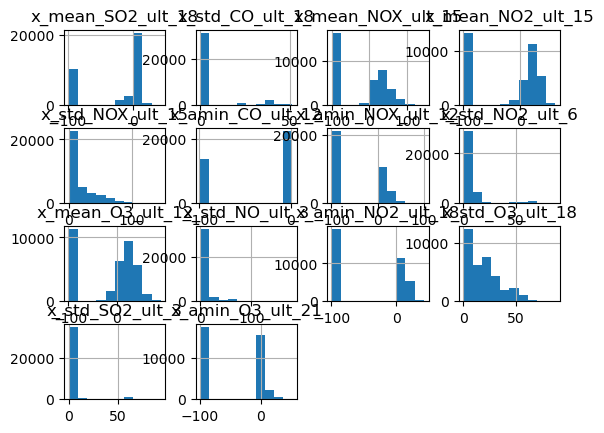

In [18]:
X = pd.read_parquet('Xaire.parquet')
Xi[mc].hist()

In [19]:
for v,li,ls in Xi[mc].describe(percentiles=[0.01,0.99]).T[['1%','99%']].reset_index().values:
    Xi[f'ex_{v}'] = ((Xi[v]<li)|(Xi[v]>ls)).astype(int)
    
Xi['ex_'] = Xi.filter(like='ex_').max(axis=1)
Xi['ex_'].value_counts(1)

0    0.900417
1    0.099583
Name: ex_, dtype: float64

array([[<Axes: title={'center': 'x_mean_SO2_ult_18'}>,
        <Axes: title={'center': 'x_std_CO_ult_18'}>,
        <Axes: title={'center': 'x_mean_NOX_ult_15'}>,
        <Axes: title={'center': 'x_mean_NO2_ult_15'}>],
       [<Axes: title={'center': 'x_std_NOX_ult_15'}>,
        <Axes: title={'center': 'x_amin_CO_ult_12'}>,
        <Axes: title={'center': 'x_amin_NOX_ult_12'}>,
        <Axes: title={'center': 'x_std_NO2_ult_6'}>],
       [<Axes: title={'center': 'x_mean_O3_ult_12'}>,
        <Axes: title={'center': 'x_std_NO_ult_3'}>,
        <Axes: title={'center': 'x_amin_NO2_ult_18'}>,
        <Axes: title={'center': 'x_std_O3_ult_18'}>],
       [<Axes: title={'center': 'x_std_SO2_ult_3'}>,
        <Axes: title={'center': 'x_amin_O3_ult_21'}>, <Axes: >, <Axes: >]],
      dtype=object)

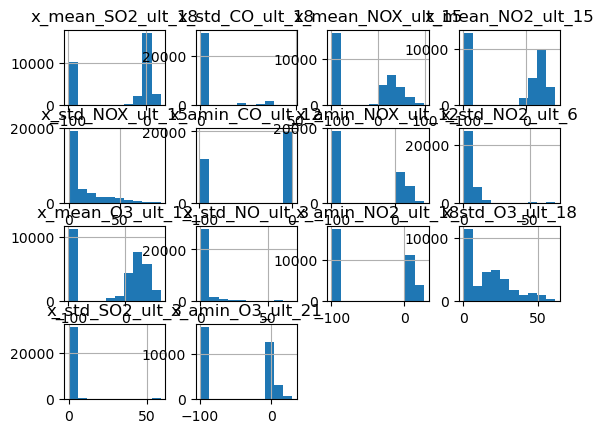

In [20]:
Xi = Xi[Xi['ex_']==0].reset_index(drop=True).drop(Xi.filter(like='ex_'),axis=1)
Xi[mc].hist()

# Reducción de dimensiones

## PCA

In [21]:
sc = StandardScaler()
pca = PCA(n_components=3)
Xp = pd.DataFrame(pca.fit_transform(sc.fit_transform(Xi)),columns=['d1','d2','d3'])
print(pca.explained_variance_ratio_.cumsum())

[0.59930778 0.6924526  0.77329893]


## MDS

In [22]:
sc = MinMaxScaler()
mds = MDS(n_components=3,n_jobs=-1)
Xm = pd.DataFrame(mds.fit_transform(sc.fit_transform(Xi.sample(1000))),columns=['d1','d2','d3'])

/home/germainguerrero/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



## t-SNE

In [23]:
tsne = TSNE(n_components=3,n_jobs=-1)
Xt = pd.DataFrame(tsne.fit_transform(Xi.sample(1000)),columns=['d1','d2','d3'])

# Visualización

In [24]:
Xp.iplot(kind='scatter3d',x='d1',y='d2',z='d3',size=10,title='PCA',color='purple')
Xm.iplot(kind='scatter3d',x='d1',y='d2',z='d3',size=10,title='MDS',color='purple')
Xt.iplot(kind='scatter3d',x='d1',y='d2',z='d3',size=10,title='TSNE',color='purple')